In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17372, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (42/42), done.
remote: Total 17372 (delta 44), reused 24 (delta 22), pack-reused 17308 (from 2)
Receiving objects: 100% (17372/17372), 16.24 MiB | 27.30 MiB/s, done.
Resolving deltas: 100% (11906/11906), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s e

In [ ]:
!python train.py \
  --img 640 \
  --batch 16 \
  --epochs 50 \
  --data /content/drive/MyDrive/yolo-ppe-dataset/data.yaml \
  --weights yolov5s.pt \
  --name ppe_detector


Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      36/49      4.71G    0.03866    0.04038   0.005854        165        640:  80% 148/186 [01:16<00:23,  1.63it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      36/49      4.71G    0.03864    0.04036   0.005835        127        640:  80% 149/186 [01:17<00:24,  1.52it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      36/49      4.71G    0.03864     0.0403   0.005833        113        640:  81% 150/186 [01:17<00:20,  1.77it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(

In [ ]:
from google.colab import files
files.download('/content/yolov5/runs/train/ppe_detector3/weights/best.pt')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download('/content/yolov5/runs/train/ppe_detector3/results.png')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!cp /content/yolov5/runs/train/ppe_detector3/weights/best.pt /content/drive/MyDrive/


In [ ]:
import torch
from google.colab import files

# Step 1: Load the trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')
model.conf = 0.5  # Set confidence threshold to 50%

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-4-9 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 640x640 2 face_nomasks, 4 hand_nogloves, 1 head_helmet, 1 head_nohelmet, 2 persons, 1 vest
Speed: 6.2ms pre-process, 7.2ms inference, 6.4ms NMS per image at shape (1, 3, 640, 640)


Saving helmet_jacket_07366.jpg to helmet_jacket_07366.jpg


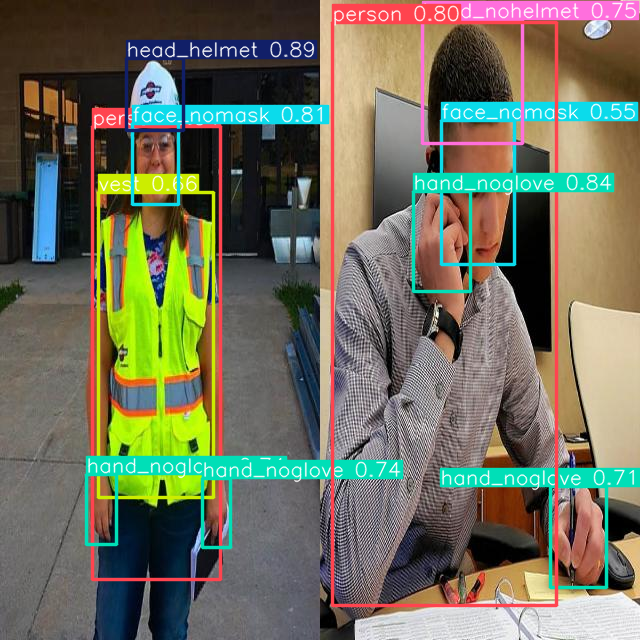

Saved 1 image to runs/detect/exp2


In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload your test image here
image_path = next(iter(uploaded))
results = model(image_path)
results.print()     # Print results
results.show()      # Show detection on image
results.save()      # Save the result to "runs/detect/exp/"



/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 360x272 1 face_mask, 2 hand_gloves, 1 head_helmet, 1 person, 1 vest
Speed: 5.7ms pre-process, 8.5ms inference, 2.0ms NMS per image at shape (1, 3, 640, 512)


Saving Screenshot 2025-04-09 124253.png to Screenshot 2025-04-09 124253 (1).png


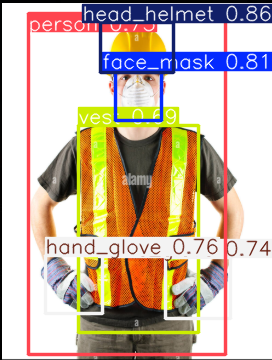

Saved 1 image to runs/detect/exp10


In [ ]:


# Step 2: Upload an image
uploaded = files.upload()
image_path = next(iter(uploaded))

# Step 3: Run detection
results = model(image_path)

# Step 4: Filter and show results
results.print()
results.show()
results.save()

# Step 5: Get detected class names with confidence > 0.5
df = results.pandas().xyxy[0]
filtered_df = df[df['confidence'] > 0.5]
detected_classes = filtered_df['name'].tolist()

# Step 6: Alert system for missing safety equipment
missing_equipment = {
    'head_nohelmet': "🚨 ALERT: No Helmet Detected!",
    'face_nomask': "🚨 ALERT: No Mask Detected!",
    'hand_noglove': "🚨 ALERT: No Glove Detected!",
}

# Alert if vest is missing (not in detections)
if 'vest' not in detected_classes:
    print("🚨 ALERT: No Vest Detected!")

# Check for any detected missing safety gear
for class_name, alert_msg in missing_equipment.items():
    if class_name in detected_classes:
        print(alert_msg)


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-4-9 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Saving ffed105d7bb0018b52c29d4087228452.jpg to ffed105d7bb0018b52c29d4087228452 (1).jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


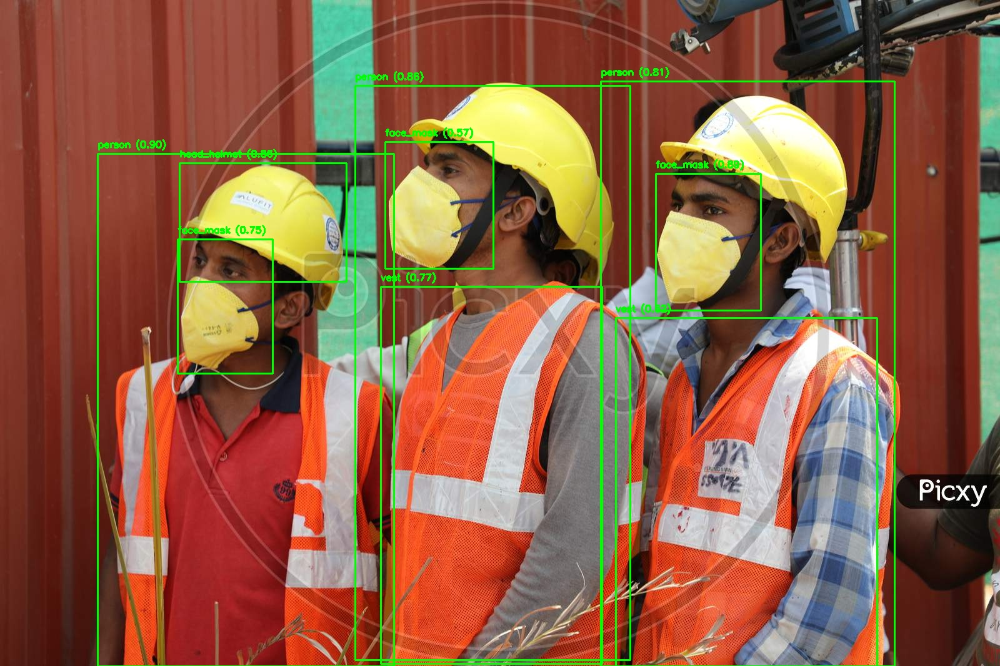


--- SAFETY VIOLATION REPORT ---
✅ No Helmet: All good
✅ No Mask: All good
✅ No Glove: All good
✅ No Vest: All good


In [ ]:
import torch
from google.colab import files
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Step 1: Load trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')
model.conf = 0.5  # Confidence threshold

# Step 2: Upload an image
uploaded = files.upload()
image_path = next(iter(uploaded))

# Step 3: Run detection
results = model(image_path)

# Step 4: Filter results
df = results.pandas().xyxy[0]
filtered_df = df[df['confidence'] > 0.5]

# Step 5: Count violators
violator_count = {
    'No Helmet': 0,
    'No Mask': 0,
    'No Glove': 0,
    'No Vest': 0
}

# Step 6: Draw bounding boxes with color coding
image = cv2.imread(image_path)

for i, row in filtered_df.iterrows():
    cls = row['name']
    conf = row['confidence']
    xmin, ymin, xmax, ymax = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Red = Violation, Green = Safe
    if cls in ['head_nohelmet', 'face_nomask', 'hand_noglove']:
        color = (0, 0, 255)  # Red
        label = f"{cls} ({conf:.2f})"

        if cls == 'head_nohelmet':
            violator_count['No Helmet'] += 1
        elif cls == 'face_nomask':
            violator_count['No Mask'] += 1
        elif cls == 'hand_noglove':
            violator_count['No Glove'] += 1
    else:
        color = (0, 255, 0)  # Green
        label = f"{cls} ({conf:.2f})"

    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Check for 'vest' presence
if 'vest' not in filtered_df['name'].tolist():
    violator_count['No Vest'] += 1

# Step 7: Display results
cv2.imwrite("result.jpg", image)
display(Image.open("result.jpg"))

# Step 8: Print alerts and summary
print("\n--- SAFETY VIOLATION REPORT ---")
for item, count in violator_count.items():
    if count > 0:
        print(f"🚨 {item}: {count} case(s) detected")
    else:
        print(f"✅ {item}: All good")


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-4-9 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Saving construction-worker-safety-gear.jpg to construction-worker-safety-gear (1).jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


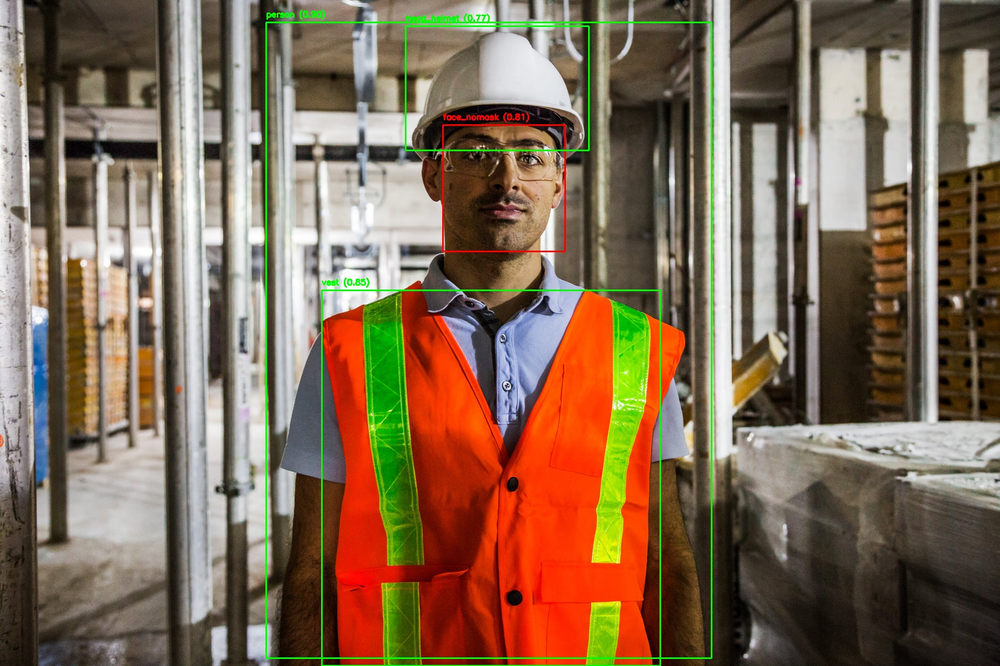


--- SAFETY VIOLATION REPORT ---
✅ No Helmet: All good
🚨 No Mask: 1 case(s) detected
✅ No Glove: All good
✅ No Vest: All good


In [ ]:
import torch
from google.colab import files
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Step 1: Load trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')
model.conf = 0.5  # Confidence threshold

# Step 2: Upload an image
uploaded = files.upload()
image_path = next(iter(uploaded))

# Step 3: Run detection
results = model(image_path)

# Step 4: Filter results
df = results.pandas().xyxy[0]
filtered_df = df[df['confidence'] > 0.5]

# Step 5: Count violators
violator_count = {
    'No Helmet': 0,
    'No Mask': 0,
    'No Glove': 0,
    'No Vest': 0
}

# Step 6: Draw bounding boxes with color coding
image = cv2.imread(image_path)

for i, row in filtered_df.iterrows():
    cls = row['name']
    conf = row['confidence']
    xmin, ymin, xmax, ymax = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Red = Violation, Green = Safe
    if cls in ['head_nohelmet', 'face_nomask', 'hand_noglove']:
        color = (0, 0, 255)  # Red
        label = f"{cls} ({conf:.2f})"

        if cls == 'head_nohelmet':
            violator_count['No Helmet'] += 1
        elif cls == 'face_nomask':
            violator_count['No Mask'] += 1
        elif cls == 'hand_noglove':
            violator_count['No Glove'] += 1
    else:
        color = (0, 255, 0)  # Green
        label = f"{cls} ({conf:.2f})"

    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Check for 'vest' presence
if 'vest' not in filtered_df['name'].tolist():
    violator_count['No Vest'] += 1

# Step 7: Display results
cv2.imwrite("result.jpg", image)
display(Image.open("result.jpg"))

# Step 8: Print alerts and summary
print("\n--- SAFETY VIOLATION REPORT ---")
for item, count in violator_count.items():
    if count > 0:
        print(f"🚨 {item}: {count} case(s) detected")
    else:
        print(f"✅ {item}: All good")


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-4-9 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Saving Screenshot 2025-04-09 133118.png to Screenshot 2025-04-09 133118.png


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


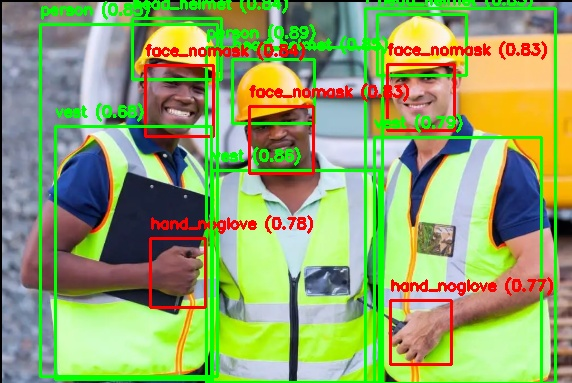


--- SAFETY VIOLATION REPORT ---
✅ No Helmet: All good
🚨 No Mask: 3 case(s) detected
🚨 No Glove: 2 case(s) detected
✅ No Vest: All good


In [ ]:
import torch
from google.colab import files
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Step 1: Load trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')
model.conf = 0.5  # Confidence threshold

# Step 2: Upload an image
uploaded = files.upload()
image_path = next(iter(uploaded))

# Step 3: Run detection
results = model(image_path)

# Step 4: Filter results
df = results.pandas().xyxy[0]
filtered_df = df[df['confidence'] > 0.5]

# Step 5: Count violators
violator_count = {
    'No Helmet': 0,
    'No Mask': 0,
    'No Glove': 0,
    'No Vest': 0
}

# Step 6: Draw bounding boxes with color coding
image = cv2.imread(image_path)

for i, row in filtered_df.iterrows():
    cls = row['name']
    conf = row['confidence']
    xmin, ymin, xmax, ymax = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Red = Violation, Green = Safe
    if cls in ['head_nohelmet', 'face_nomask', 'hand_noglove']:
        color = (0, 0, 255)  # Red
        label = f"{cls} ({conf:.2f})"

        if cls == 'head_nohelmet':
            violator_count['No Helmet'] += 1
        elif cls == 'face_nomask':
            violator_count['No Mask'] += 1
        elif cls == 'hand_noglove':
            violator_count['No Glove'] += 1
    else:
        color = (0, 255, 0)  # Green
        label = f"{cls} ({conf:.2f})"

    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Check for 'vest' presence
if 'vest' not in filtered_df['name'].tolist():
    violator_count['No Vest'] += 1

# Step 7: Display results
cv2.imwrite("result.jpg", image)
display(Image.open("result.jpg"))

# Step 8: Print alerts and summary
print("\n--- SAFETY VIOLATION REPORT ---")
for item, count in violator_count.items():
    if count > 0:
        print(f"🚨 {item}: {count} case(s) detected")
    else:
        print(f"✅ {item}: All good")


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-4-9 Python-3.11.11 torch-2.6.0+cu124 CPU

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Saving Screenshot 2025-04-09 134414.png to Screenshot 2025-04-09 134414.png


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


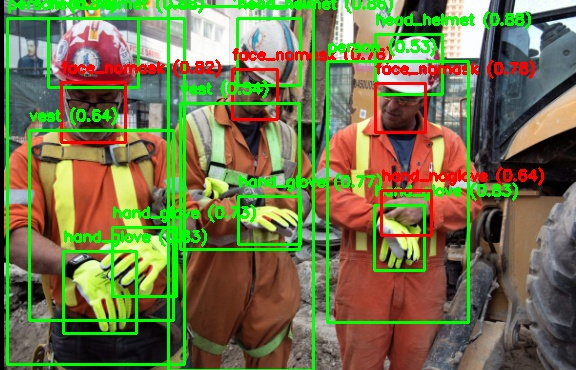


--- SAFETY VIOLATION REPORT ---
✅ No Helmet: All good
🚨 No Mask: 3 case(s) detected
🚨 No Glove: 1 case(s) detected
✅ No Vest: All good


In [ ]:
import torch
from google.colab import files
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Step 1: Load trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')
model.conf = 0.5  # Confidence threshold

# Step 2: Upload an image
uploaded = files.upload()
image_path = next(iter(uploaded))

# Step 3: Run detection
results = model(image_path)

# Step 4: Filter results
df = results.pandas().xyxy[0]
filtered_df = df[df['confidence'] > 0.5]

# Step 5: Count violators
violator_count = {
    'No Helmet': 0,
    'No Mask': 0,
    'No Glove': 0,
    'No Vest': 0
}

# Step 6: Draw bounding boxes with color coding
image = cv2.imread(image_path)

for i, row in filtered_df.iterrows():
    cls = row['name']
    conf = row['confidence']
    xmin, ymin, xmax, ymax = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Red = Violation, Green = Safe
    if cls in ['head_nohelmet', 'face_nomask', 'hand_noglove']:
        color = (0, 0, 255)  # Red
        label = f"{cls} ({conf:.2f})"

        if cls == 'head_nohelmet':
            violator_count['No Helmet'] += 1
        elif cls == 'face_nomask':
            violator_count['No Mask'] += 1
        elif cls == 'hand_noglove':
            violator_count['No Glove'] += 1
    else:
        color = (0, 255, 0)  # Green
        label = f"{cls} ({conf:.2f})"

    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Check for 'vest' presence
if 'vest' not in filtered_df['name'].tolist():
    violator_count['No Vest'] += 1

# Step 7: Display results
cv2.imwrite("result.jpg", image)
display(Image.open("result.jpg"))

# Step 8: Print alerts and summary
print("\n--- SAFETY VIOLATION REPORT ---")
for item, count in violator_count.items():
    if count > 0:
        print(f"🚨 {item}: {count} case(s) detected")
    else:
        print(f"✅ {item}: All good")


/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2025-4-10 Python-3.11.11 torch-2.6.0+cu124 CPU

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Saving Screenshot 2025-04-10 090318.png to Screenshot 2025-04-10 090318.png


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


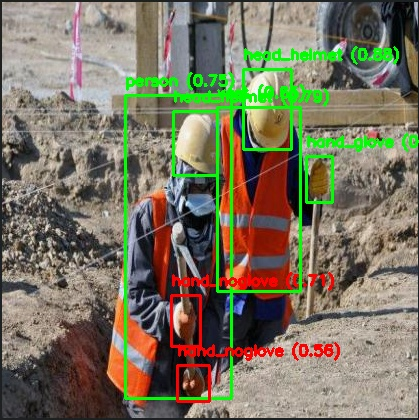


--- SAFETY VIOLATION REPORT ---
✅ No Helmet: All good
✅ No Mask: All good
🚨 No Glove: 2 case(s) detected
✅ No Vest: All good


In [ ]:
import torch
from google.colab import files
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Step 1: Load trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')
model.conf = 0.5  # Confidence threshold

# Step 2: Upload an image
uploaded = files.upload()
image_path = next(iter(uploaded))

# Step 3: Run detection
results = model(image_path)

# Step 4: Filter results
df = results.pandas().xyxy[0]
filtered_df = df[df['confidence'] > 0.5]

# Step 5: Count violators
violator_count = {
    'No Helmet': 0,
    'No Mask': 0,
    'No Glove': 0,
    'No Vest': 0
}

# Step 6: Draw bounding boxes with color coding
image = cv2.imread(image_path)

for i, row in filtered_df.iterrows():
    cls = row['name']
    conf = row['confidence']
    xmin, ymin, xmax, ymax = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Red = Violation, Green = Safe
    if cls in ['head_nohelmet', 'face_nomask', 'hand_noglove']:
        color = (0, 0, 255)  # Red
        label = f"{cls} ({conf:.2f})"

        if cls == 'head_nohelmet':
            violator_count['No Helmet'] += 1
        elif cls == 'face_nomask':
            violator_count['No Mask'] += 1
        elif cls == 'hand_noglove':
            violator_count['No Glove'] += 1
    else:
        color = (0, 255, 0)  # Green
        label = f"{cls} ({conf:.2f})"

    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Check for 'vest' presence
if 'vest' not in filtered_df['name'].tolist():
    violator_count['No Vest'] += 1

# Step 7: Display results
cv2.imwrite("result.jpg", image)
display(Image.open("result.jpg"))

# Step 8: Print alerts and summary
print("\n--- SAFETY VIOLATION REPORT ---")
for item, count in violator_count.items():
    if count > 0:
        print(f"🚨 {item}: {count} case(s) detected")
    else:
        print(f"✅ {item}: All good")


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-4-10 Python-3.11.11 torch-2.6.0+cu124 CPU

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Saving helmet_jacket_07366.jpg to helmet_jacket_07366.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


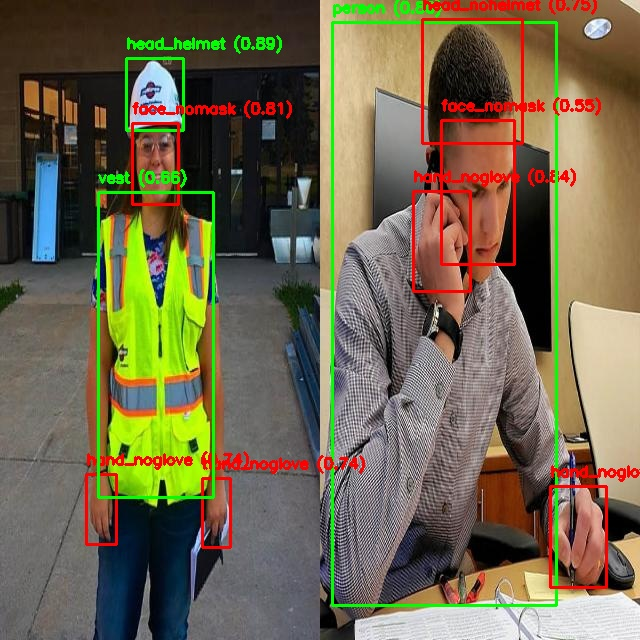


--- SAFETY VIOLATION REPORT ---
🚨 No Helmet: 1 case(s) detected
🚨 No Mask: 2 case(s) detected
🚨 No Glove: 4 case(s) detected
✅ No Vest: All good


In [ ]:
import torch
from google.colab import files
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Step 1: Load trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')
model.conf = 0.5  # Confidence threshold

# Step 2: Upload an image
uploaded = files.upload()
image_path = next(iter(uploaded))

# Step 3: Run detection
results = model(image_path)

# Step 4: Filter results
df = results.pandas().xyxy[0]
filtered_df = df[df['confidence'] > 0.5]

# Step 5: Count violators
violator_count = {
    'No Helmet': 0,
    'No Mask': 0,
    'No Glove': 0,
    'No Vest': 0
}

# Step 6: Draw bounding boxes with color coding
image = cv2.imread(image_path)

for i, row in filtered_df.iterrows():
    cls = row['name']
    conf = row['confidence']
    xmin, ymin, xmax, ymax = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Red = Violation, Green = Safe
    if cls in ['head_nohelmet', 'face_nomask', 'hand_noglove']:
        color = (0, 0, 255)  # Red
        label = f"{cls} ({conf:.2f})"

        if cls == 'head_nohelmet':
            violator_count['No Helmet'] += 1
        elif cls == 'face_nomask':
            violator_count['No Mask'] += 1
        elif cls == 'hand_noglove':
            violator_count['No Glove'] += 1
    else:
        color = (0, 255, 0)  # Green
        label = f"{cls} ({conf:.2f})"

    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Check for 'vest' presence
if 'vest' not in filtered_df['name'].tolist():
    violator_count['No Vest'] += 1

# Step 7: Display results
cv2.imwrite("result.jpg", image)
display(Image.open("result.jpg"))

# Step 8: Print alerts and summary
print("\n--- SAFETY VIOLATION REPORT ---")
for item, count in violator_count.items():
    if count > 0:
        print(f"🚨 {item}: {count} case(s) detected")
    else:
        print(f"✅ {item}: All good")


In [ ]:
import os
from collections import Counter

# Path to your training labels folder
labels_path = "/content/drive/MyDrive/yolo-ppe-dataset/train/labels"

class_counts = Counter()

# Loop through all label files
for label_file in os.listdir(labels_path):
    if label_file.endswith(".txt"):
        with open(os.path.join(labels_path, label_file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                class_id = line.strip().split()[0]
                class_counts[int(class_id)] += 1

# Print results
print("Class Counts:", class_counts)


Class Counts: Counter({6: 5547, 2: 3236, 0: 2512, 3: 1452, 1: 1407, 4: 1330, 5: 1312, 7: 689})


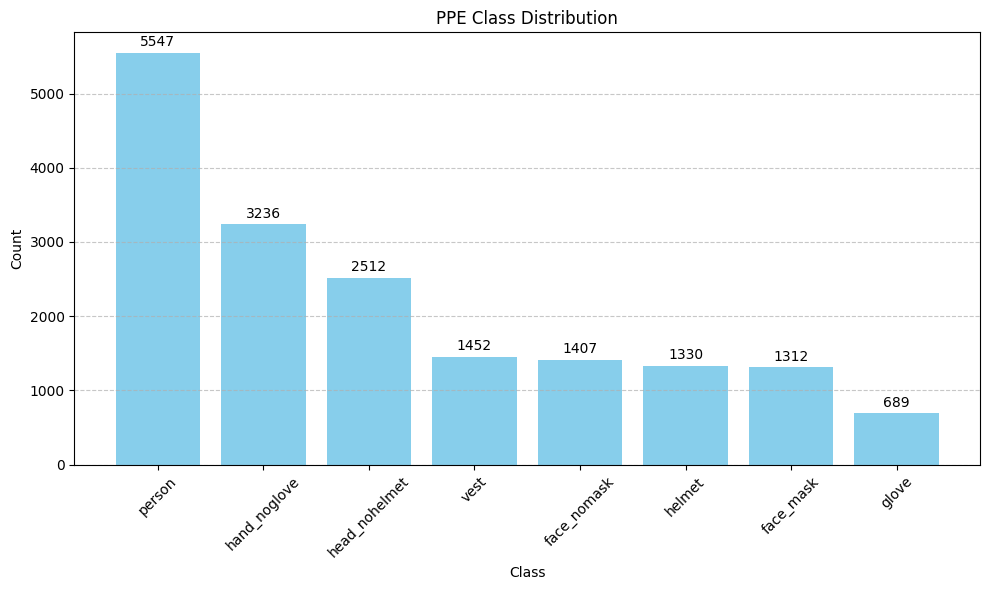

In [ ]:
import matplotlib.pyplot as plt

# Step 1: Define class names (you can adjust if your classes differ)
class_names = {
    0: 'head_nohelmet',
    1: 'face_nomask',
    2: 'hand_noglove',
    3: 'vest',
    4: 'helmet',
    5: 'face_mask',
    6: 'person',
    7: 'glove'
}

# Step 2: Class counts from your dataset
class_counts = {6: 5547, 2: 3236, 0: 2512, 3: 1452, 1: 1407, 4: 1330, 5: 1312, 7: 689}

# Step 3: Convert IDs to names for plotting
labels = [class_names[i] for i in class_counts.keys()]
values = list(class_counts.values())

# Step 4: Plot
plt.figure(figsize=(10, 6))
bars = plt.bar(labels, values, color='skyblue')
plt.title("PPE Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")

# Step 5: Add count labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 50, int(yval), ha='center', va='bottom')

plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
